In [3]:
# Load packages

from sklearn.preprocessing import StandardScaler

import pandas as pd
import numpy as np
import missingno as msno
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler , Normalizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from scipy.stats import norm
from scipy import stats
from sklearn import metrics
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

### Data Loading

In [2]:
df = pd.read_csv("Cleaned-Data.csv")
pd.pandas.set_option('display.max_columns', None)

### EDA

In [3]:
display('Peeking into data', df)

'Peeking into data'

,Fever,Tiredness,Dry-Cough,Difficulty-in-Breathing,Sore-Throat,None_Sympton,Pains,Nasal-Congestion,Runny-Nose,Diarrhea,None_Experiencing,Age_0-9,Age_10-19,Age_20-24,Age_25-59,Age_60+,Gender_Female,Gender_Male,Gender_Transgender,Severity_Mild,Severity_Moderate,Severity_None,Severity_Severe,Contact_Dont-Know,Contact_No,Contact_Yes,Country
0,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,China
1,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,China
2,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,0,China
3,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,China
4,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,China
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
316795,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,Other
316796,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,Other
316797,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,Other
316798,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,Other


In [4]:
# Null Values
display("Null Values", df.isnull().sum())

'Null Values'

Fever                      0
Tiredness                  0
Dry-Cough                  0
Difficulty-in-Breathing    0
Sore-Throat                0
None_Sympton               0
Pains                      0
Nasal-Congestion           0
Runny-Nose                 0
Diarrhea                   0
None_Experiencing          0
Age_0-9                    0
Age_10-19                  0
Age_20-24                  0
Age_25-59                  0
Age_60+                    0
Gender_Female              0
Gender_Male                0
Gender_Transgender         0
Severity_Mild              0
Severity_Moderate          0
Severity_None              0
Severity_Severe            0
Contact_Dont-Know          0
Contact_No                 0
Contact_Yes                0
Country                    0
dtype: int64

<AxesSubplot:>

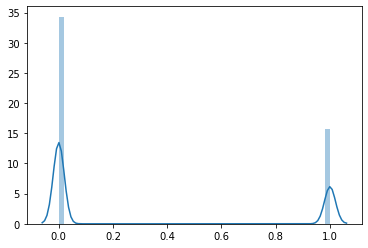

In [5]:
# Check distribution of data
sns.distplot(df.drop('Country', axis = 1))

In [6]:
for i in df.columns:
    print ("\nColumn Name:", i, "-->", df[i].unique(), "-->Unique Count", len(df[i].unique()))


Column Name: Fever --> [1 0] -->Unique Count 2

Column Name: Tiredness --> [1 0] -->Unique Count 2

Column Name: Dry-Cough --> [1 0] -->Unique Count 2

Column Name: Difficulty-in-Breathing --> [1 0] -->Unique Count 2

Column Name: Sore-Throat --> [1 0] -->Unique Count 2

Column Name: None_Sympton --> [0 1] -->Unique Count 2

Column Name: Pains --> [1 0] -->Unique Count 2

Column Name: Nasal-Congestion --> [1 0] -->Unique Count 2

Column Name: Runny-Nose --> [1 0] -->Unique Count 2

Column Name: Diarrhea --> [1 0] -->Unique Count 2

Column Name: None_Experiencing --> [0 1] -->Unique Count 2

Column Name: Age_0-9 --> [1 0] -->Unique Count 2

Column Name: Age_10-19 --> [0 1] -->Unique Count 2

Column Name: Age_20-24 --> [0 1] -->Unique Count 2

Column Name: Age_25-59 --> [0 1] -->Unique Count 2

Column Name: Age_60+ --> [0 1] -->Unique Count 2

Column Name: Gender_Female --> [0 1] -->Unique Count 2

Column Name: Gender_Male --> [1 0] -->Unique Count 2

Column Name: Gender_Transgender -->

In [7]:
## Combine all the severity into 1 columns
severity_columns = df.filter(like='Severity_').columns

# Replace '0' with No
df['Severity_None'].replace({1:'None', 0: "No"}, inplace = True)
df['Severity_Mild'].replace({1:'Mild', 0: "No"}, inplace = True)
df['Severity_Moderate'].replace({1:'Moderate', 0: "No"}, inplace = True)
df['Severity_Severe'].replace({1:'Severe', 0: "No"}, inplace = True)

# Create new column called Condition
df['Condition'] = df[severity_columns].values.tolist()

In [8]:
def removing(list1):
    list1 = set(list1)
    list1.discard("No")

    a = ''.join(list1)
    return a

In [9]:
df['Condition'] = df['Condition'].apply(removing)

In [10]:
## Grouping by severity

age_columns = df.filter(like='Age_').columns
gender_columns = df.filter(like='Gender_').columns
contact_columns = df.filter(like='Contact_').columns


In [11]:
No_risk_age = df.groupby(['Severity_None'])[age_columns].sum()
No_risk_gender = df.groupby(['Severity_None'])[gender_columns].sum()
No_risk_contact = df.groupby(['Severity_None'])[contact_columns].sum()


In [12]:
Low_risk_age = df.groupby(['Severity_Mild'])[age_columns].sum()
Low_risk_gender = df.groupby(['Severity_Mild'])[gender_columns].sum()
Low_risk_contact = df.groupby(['Severity_Mild'])[contact_columns].sum()


In [13]:
Moderate_risk_age = df.groupby(['Severity_Moderate'])[age_columns].sum()
Moderate_risk_gender = df.groupby(['Severity_Moderate'])[gender_columns].sum()
Moderate_risk_contact = df.groupby(['Severity_Moderate'])[contact_columns].sum()


In [14]:
Severe_risk_age = df.groupby(['Severity_Severe'])[age_columns].sum()
Severe_risk_gender = df.groupby(['Severity_Severe'])[gender_columns].sum()
Severe_risk_contact = df.groupby(['Severity_Severe'])[contact_columns].sum()


<AxesSubplot:xlabel='Condition', ylabel='count'>

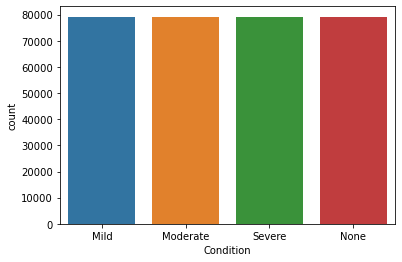

In [15]:
sns.countplot(df['Condition'])

### Preprocessing

In this section, we will convert the conditions by applying one-hot encoding, converting them into columns of 1-s and 0-s.

In [17]:
## Remove country, remove severity_columns : Severity_Mild, Severity_Moderate, Severity_Severe.

df.drop("Country", axis=1, inplace=True) 
df.drop(severity_columns, axis=1, inplace=True)
df['Symptoms_Score']= df.iloc[:, :5].sum(axis=1) + df.iloc[:, 6:10].sum(axis=1)
df.shape

(316800, 24)

In [18]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
df['Condition'] = le.fit_transform(df['Condition'])

### Feature Engineering

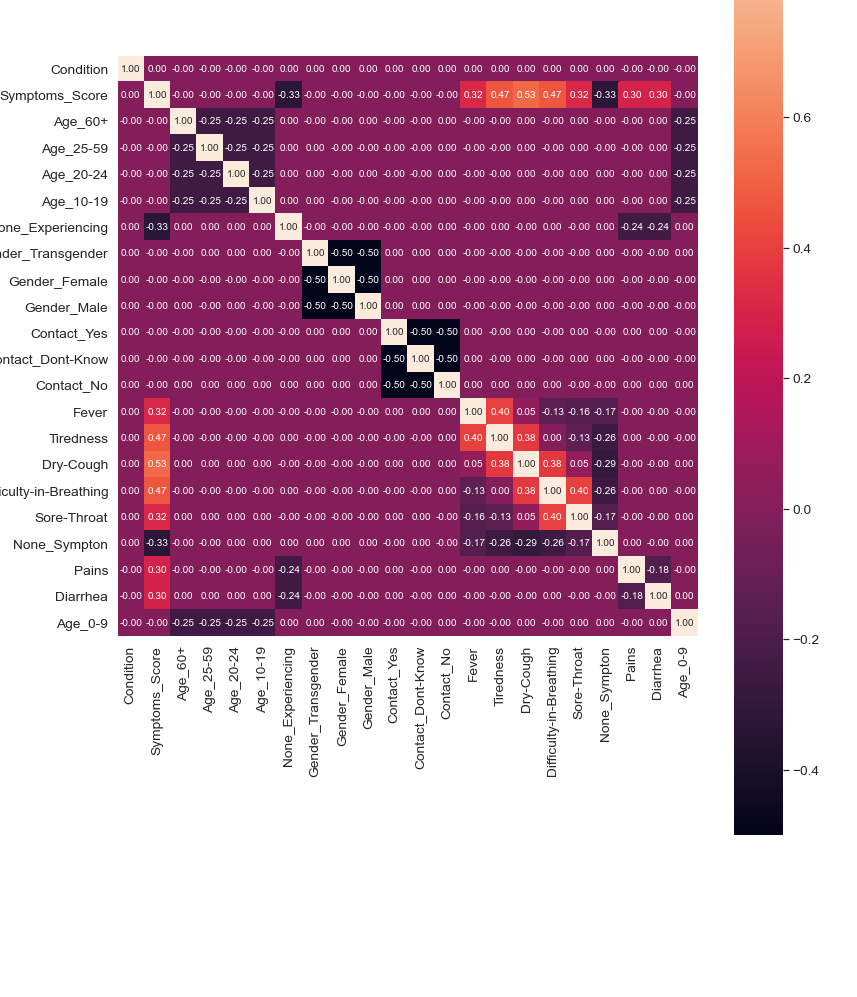

In [21]:
# Plot correlation among all the features. Sort by largest correlation with "Condition"
from pylab import rcParams
rcParams['figure.figsize'] = 13, 18
corrmat = df.corr()
k = 22
cols = corrmat.nlargest(k, 'Condition')['Condition'].index
cm = np.corrcoef(df[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

## Unsupervised learning

In [4]:
# Reload data
corona_pd = pd.read_csv("Cleaned-Data.csv")
corona_pd.sample(5)

,Fever,Tiredness,Dry-Cough,Difficulty-in-Breathing,Sore-Throat,None_Sympton,Pains,Nasal-Congestion,Runny-Nose,Diarrhea,...,Gender_Male,Gender_Transgender,Severity_Mild,Severity_Moderate,Severity_None,Severity_Severe,Contact_Dont-Know,Contact_No,Contact_Yes,Country
96097,0,1,0,0,0,0,1,1,1,1,...,1,0,1,0,0,0,0,1,0,Republic of Korean
75852,0,0,0,0,1,0,0,0,1,1,...,0,1,1,0,0,0,0,0,1,Iran
11635,0,1,0,0,0,0,1,1,1,0,...,0,1,0,0,0,1,0,1,0,China
138378,0,1,0,0,0,0,1,0,0,0,...,0,1,0,0,0,1,0,0,1,France
43524,0,0,1,1,1,0,0,0,1,0,...,0,1,1,0,0,0,0,0,1,Italy


In [5]:
## Remove Country from corona_df
corona_pd.drop("Country", axis = 1, inplace=True)

## Check for duplicated values
corona_pd.drop_duplicates(inplace=True)

<AxesSubplot:>

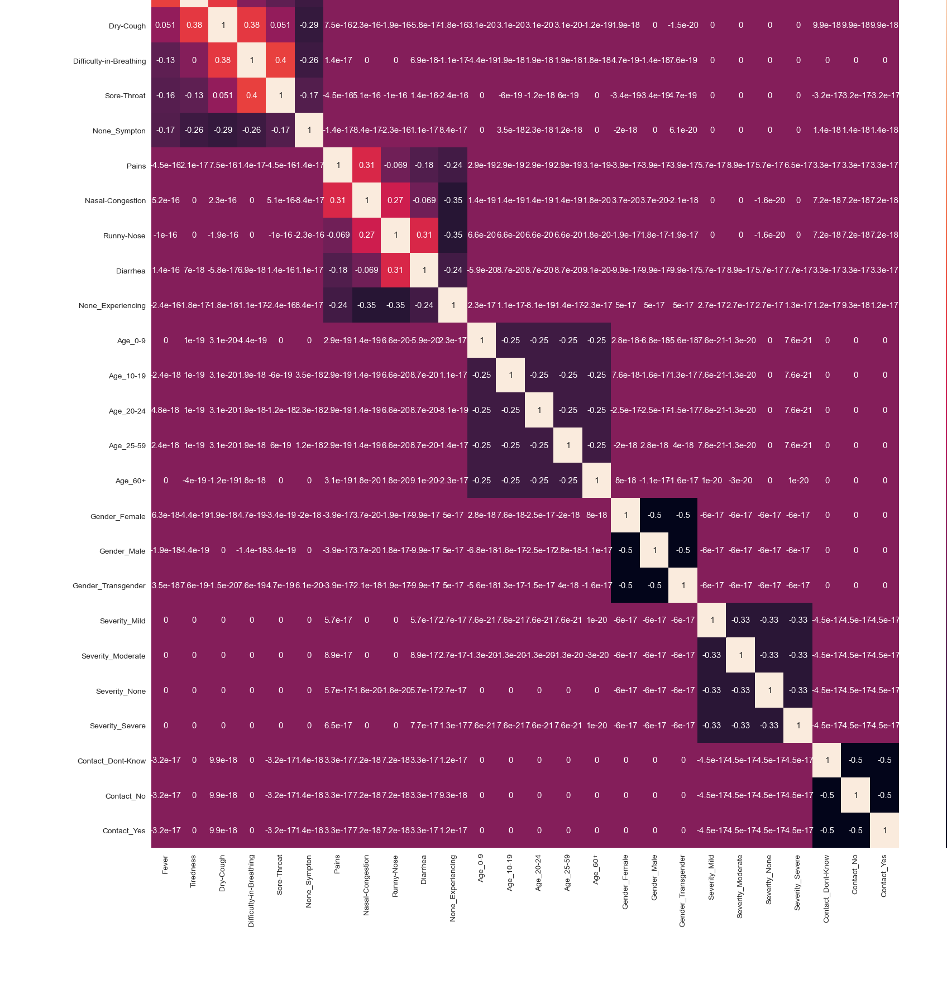

In [28]:
## Plot correlation matrix between features
f, ax = plt.subplots(figsize =(30,30))
sns.heatmap(corona_pd.corr(), annot=True)

We can see that each feature has an effect on other features linear correlated.


### Elbow Method to find optimal number of clusters

In [6]:
# Scale values
scaler = StandardScaler()
corona_pd_scaled = scaler.fit_transform(corona_pd)

In [32]:
# To get Within Cluster Sum of Squares for each cluster to find optimal number of K values
scores = []
for i in range(1,20):
    corona_means = KMeans(n_clusters=i)
    corona_means.fit(corona_pd_scaled)
    scores.append(corona_means.inertia_)

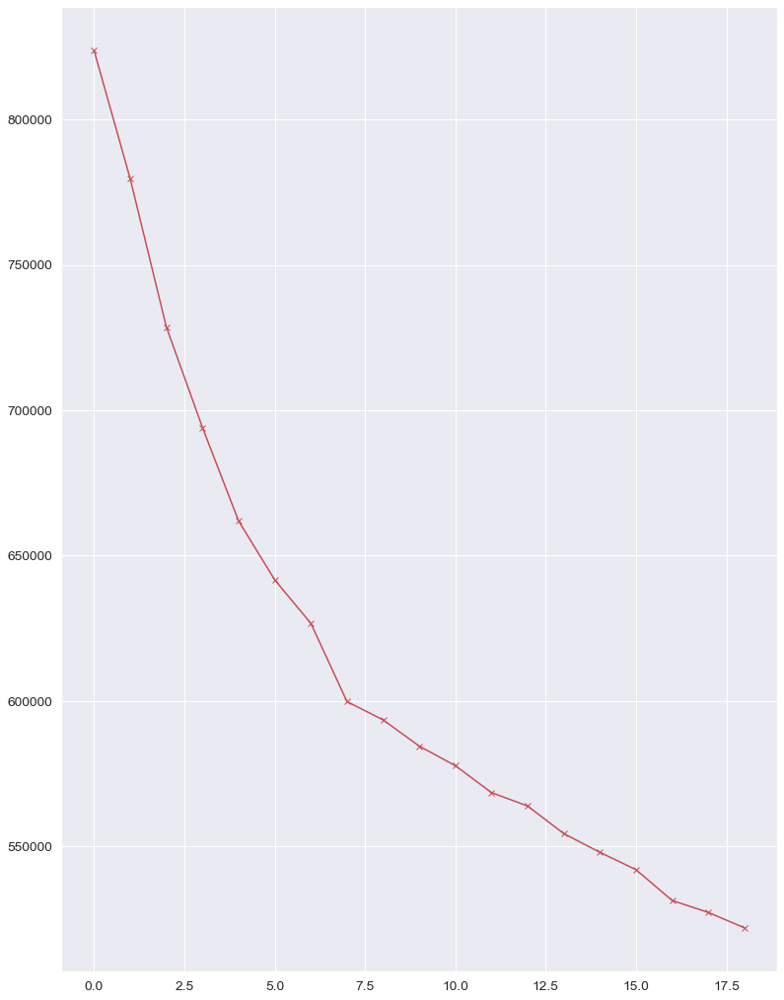

In [34]:
# Plot values from Kmeans
plt.plot(scores, '-rx')

From our graph, it looks like an elbow at n_cluster = 7.

In [95]:
## K-Means implementation
corona_means= KMeans(n_clusters=7, random_state = 111)
corona_means.fit(corona_pd_scaled)

# Return an array with cluster labels.list
labels = corona_means.labels_

In [96]:
# Create Data frame with Cluster Centres
corona_pd_m = pd.DataFrame(corona_means.cluster_centers_, columns=corona_pd.columns)
corona_pd_m.head()

,Fever,Tiredness,Dry-Cough,Difficulty-in-Breathing,Sore-Throat,None_Sympton,Pains,Nasal-Congestion,Runny-Nose,Diarrhea,None_Experiencing,Age_0-9,Age_10-19,Age_20-24,Age_25-59,Age_60+,Gender_Female,Gender_Male,Gender_Transgender,Severity_Mild,Severity_Moderate,Severity_None,Severity_Severe,Contact_Dont-Know,Contact_No,Contact_Yes
0,1.391110e-14,0.0,-4.645491e-15,0.000000,8.112268e-16,-7.275774e-15,0.075593,0.109545,0.109545,0.075593,-0.316228,-5.000000e-01,-5.000000e-01,2.000000e+00,-5.000000e-01,-5.000000e-01,-3.332137e-15,8.793723e-15,8.802772e-15,-1.366752e-19,-4.555839e-20,-7.392375e-17,-4.555839e-20,7.401487e-17,7.401487e-17,7.401487e-17
1,1.391110e-14,0.0,-4.645491e-15,0.000000,8.112268e-16,-7.275774e-15,0.075593,0.109545,0.109545,0.075593,-0.316228,-5.000000e-01,-5.000000e-01,-5.000000e-01,2.000000e+00,-5.000000e-01,-3.332137e-15,8.793723e-15,8.802772e-15,-1.366752e-19,-4.555839e-20,-7.392375e-17,-4.555839e-20,7.401487e-17,7.401487e-17,7.401487e-17
2,1.391110e-14,0.0,-4.645491e-15,0.000000,8.112268e-16,-7.275774e-15,0.075593,0.109545,0.109545,0.075593,-0.316228,-5.000000e-01,2.000000e+00,-5.000000e-01,-5.000000e-01,-5.000000e-01,-3.332137e-15,8.793723e-15,8.802772e-15,-1.366752e-19,-4.555839e-20,-7.392375e-17,-4.555839e-20,7.401487e-17,7.401487e-17,7.401487e-17
3,-1.329331e-15,0.0,7.527368e-16,0.000000,9.158639e-17,1.494596e-16,-0.755929,-1.095445,-1.095445,-0.755929,3.162278,-1.360093e-16,8.410780e-20,8.410780e-20,6.282678e-17,1.358621e-16,1.360367e-15,-2.009363e-15,-2.087976e-15,-2.523234e-19,-8.410780e-20,-7.384665e-17,-8.410780e-20,7.401487e-17,7.401487e-17,7.401487e-17
4,5.025854e-01,1.0,5.154061e-01,0.090909,-8.580726e-02,-2.581989e-01,0.075593,0.109545,0.109545,0.075593,-0.316228,2.000000e+00,-5.000000e-01,-5.000000e-01,-5.000000e-01,-5.000000e-01,5.430729e-15,-4.025596e-15,-4.026843e-15,-2.733504e-19,-9.111679e-20,-7.164583e-17,-1.331707e-19,-3.214122e-02,6.428243e-02,-3.214122e-02


In [97]:
# Concatenating cluster lables
corona_cluster = pd.concat([corona_pd, pd.DataFrame({"Cluster":labels})], axis=1)
corona_cluster.sample(5)

,Fever,Tiredness,Dry-Cough,Difficulty-in-Breathing,Sore-Throat,None_Sympton,Pains,Nasal-Congestion,Runny-Nose,Diarrhea,None_Experiencing,Age_0-9,Age_10-19,Age_20-24,Age_25-59,Age_60+,Gender_Female,Gender_Male,Gender_Transgender,Severity_Mild,Severity_Moderate,Severity_None,Severity_Severe,Contact_Dont-Know,Contact_No,Contact_Yes,Cluster
29810,1,1,1,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,1,0,0,0,1,0,0,5
19133,1,1,1,1,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,3
21289,1,1,1,1,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,1
11425,0,1,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,1,0,2
24850,0,0,0,1,1,0,1,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,1


In [98]:
# Distribution of cluster
corona_cluster.Cluster.value_counts()

5    5760
2    5760
1    5760
0    5760
6    3120
3    2880
4    2640
Name: Cluster, dtype: int64

In [99]:
corona_cluster.groupby(['Cluster'])['Gender_Male', 'Gender_Female'].sum()

,Gender_Male,Gender_Female
Cluster,,
0,1920,1920
1,1920,1920
2,1920,1920
3,960,960
4,880,880
5,1920,1920
6,1040,1040


In [100]:
corona_cluster.groupby(['Cluster'])['Severity_Mild', 'Severity_Moderate', 'Severity_Severe', 'Severity_None'].sum()

,Severity_Mild,Severity_Moderate,Severity_Severe,Severity_None
Cluster,,,,
0,1440,1440,1440,1440
1,1440,1440,1440,1440
2,1440,1440,1440,1440
3,720,720,720,720
4,660,660,660,660
5,1440,1440,1440,1440
6,780,780,780,780


In [101]:
corona_cluster.groupby(['Cluster'])['None_Experiencing', 'Diarrhea', 'Runny-Nose', 'Difficulty-in-Breathing', 'Gender_Male', 'Gender_Female'].sum()

,None_Experiencing,Diarrhea,Runny-Nose,Difficulty-in-Breathing,Gender_Male,Gender_Female
Cluster,,,,,,
0,0,2304,3456,2880,1920,1920
1,0,2304,3456,2880,1920,1920
2,0,2304,3456,2880,1920,1920
3,2880,0,0,1440,960,960
4,0,1056,1584,1440,880,880
5,0,2304,3456,2880,1920,1920
6,0,1248,1872,1440,1040,1040


In [102]:
age_columns = corona_cluster.filter(like='Age_').columns
# age_columns
corona_cluster.groupby(['Cluster'])['Age_0-9', 'Age_10-19', 'Age_20-24', 'Age_25-59', 'Age_60+'].sum()

,Age_0-9,Age_10-19,Age_20-24,Age_25-59,Age_60+
Cluster,,,,,
0,0,0,5760,0,0
1,0,0,0,5760,0
2,0,5760,0,0,0
3,576,576,576,576,576
4,2640,0,0,0,0
5,0,0,0,0,5760
6,3120,0,0,0,0


## Principal Component Analysis (PCA)
To perform dimensionality reduction. 

In [111]:
# implement pca with 3 components
corona_pca = PCA(n_components=3)
principal_comp = corona_pca.fit_transform(corona_pd_scaled)

In [112]:
principal_comp_df = pd.DataFrame(principal_comp, columns=['pca1', 'pca2','pca3'])
principal_comp_df.head()

,pca1,pca2,pca3
0,-2.144292,-1.778780,0.071518
1,-2.128788,-1.698204,0.270362
2,-2.154348,-1.766095,0.141214
3,-2.130915,-1.728433,0.131853
4,-2.115411,-1.647857,0.330697


In [113]:
principal_comp_df=pd.concat([principal_comp_df,pd.DataFrame({"Cluster":labels})],axis=1)
principal_comp_df.sample(5)

,pca1,pca2,pca3,Cluster
15665,-1.137298,-0.289045,-0.163811,0
27105,0.763860,0.735733,0.796599,5
5842,0.204977,-0.252356,2.204145,6
5644,-0.268885,0.465602,1.222981,6
8762,-0.698758,-1.246948,-2.138697,2


In [114]:
var = principal_comp.explained_variance_ratio_
print(var)

AttributeError: 'numpy.ndarray' object has no attribute 'explained_variance_ratio_'

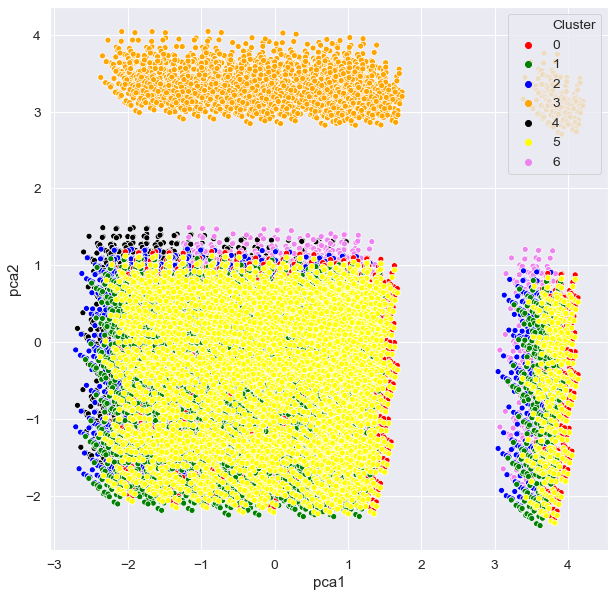

In [106]:
#Plotting the 2d-plot.
plt.figure(figsize=(10,10))
ax=sns.scatterplot(x='pca1',y='pca2',hue="Cluster",data=principal_comp ,palette=['red','green','blue','orange','black','yellow','violet'])
plt.show()

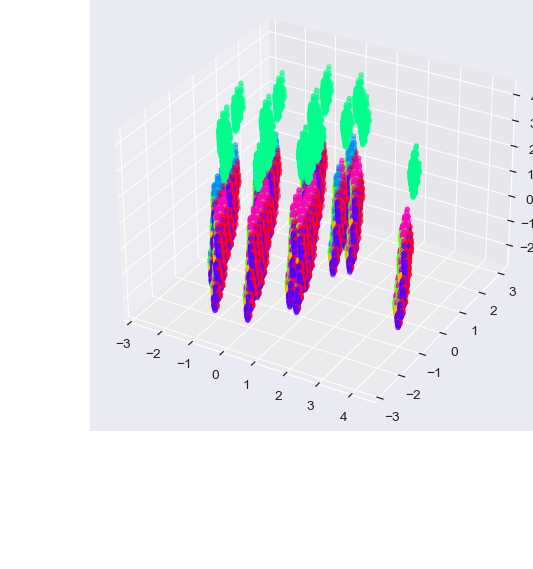

In [107]:
#Plotting the 3d-plot
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
sc=ax.scatter(xs=principal_comp['pca1'],ys=principal_comp['pca3'],zs=principal_comp['pca2'],c=principal_comp['Cluster'],marker='o',cmap="gist_rainbow")
plt.colorbar(sc)
plt.show()

## K Modes Clustering

In [13]:
# !pip install kmodes
from kmodes.kmodes import KModes

In [14]:
corona_pd_scaled.shape

(31680, 26)

In [18]:
# %%timeit
cost = []
K = range(1,5)
for num_clusters in list(K):
    kmode = KModes(n_clusters=num_clusters, init = "random", n_init = 5, verbose=1, random_state = 111)
    kmode.fit_predict(corona_pd_scaled)
    cost.append(kmode.cost_)
    

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 248760.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 248760.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 248760.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 248760.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 248760.0
Best run was number 1
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 7548, cost: 221760.0
Run 1, iteration: 2/100, moves: 1728, cost: 221760.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 8268, cost: 218160.0
Init: ini

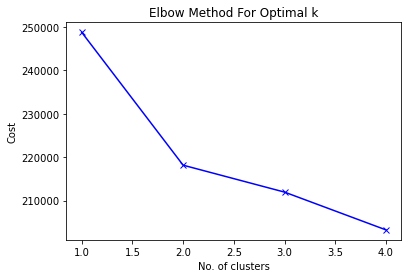

In [19]:
plt.plot(K, cost, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')
plt.show()

In [20]:
## build model wtih clusters
kmode = KModes(n_clusters = 2, init = "random", n_init = 5, verbose = 1, random_state = 111)
clusters = kmode.fit_predict(corona_pd_scaled)
clusters

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 7548, cost: 221760.0
Run 1, iteration: 2/100, moves: 1728, cost: 221760.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 8268, cost: 218160.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 9436, cost: 234680.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 8190, cost: 221760.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 7752, cost: 229680.0
Best run was number 2


array([1, 1, 1, ..., 0, 0, 0], dtype=uint16)

In [34]:
clusters = clusters.reshape(-1,1)
clusters.shape

(31680, 1)

In [35]:
kmode_df = np.concatenate((clusters, corona_pd_scaled), axis = 1)


In [36]:
kmode_df

array([[ 1.        ,  1.4832397 ,  1.        , ..., -0.70710678,
        -0.70710678,  1.41421356],
       [ 1.        ,  1.4832397 ,  1.        , ..., -0.70710678,
         1.41421356, -0.70710678],
       [ 1.        ,  1.4832397 ,  1.        , ...,  1.41421356,
        -0.70710678, -0.70710678],
       ...,
       [ 0.        , -0.67419986, -1.        , ..., -0.70710678,
        -0.70710678,  1.41421356],
       [ 0.        , -0.67419986, -1.        , ..., -0.70710678,
         1.41421356, -0.70710678],
       [ 0.        , -0.67419986, -1.        , ...,  1.41421356,
        -0.70710678, -0.70710678]])

In [41]:
new_colums = corona_pd.columns.insert(0, 'Clusters')
kmode_df_final = pd.DataFrame(kmode_df, columns = new_colums)

In [42]:
kmode_df_final.head()

,Clusters,Fever,Tiredness,Dry-Cough,Difficulty-in-Breathing,Sore-Throat,None_Sympton,Pains,Nasal-Congestion,Runny-Nose,...,Gender_Female,Gender_Male,Gender_Transgender,Severity_Mild,Severity_Moderate,Severity_None,Severity_Severe,Contact_Dont-Know,Contact_No,Contact_Yes
0,1.0,1.48324,1.0,0.881917,1.0,1.48324,-0.258199,1.322876,0.912871,0.912871,...,-0.707107,1.414214,-0.707107,1.732051,-0.577350,-0.57735,-0.57735,-0.707107,-0.707107,1.414214
1,1.0,1.48324,1.0,0.881917,1.0,1.48324,-0.258199,1.322876,0.912871,0.912871,...,-0.707107,1.414214,-0.707107,1.732051,-0.577350,-0.57735,-0.57735,-0.707107,1.414214,-0.707107
2,1.0,1.48324,1.0,0.881917,1.0,1.48324,-0.258199,1.322876,0.912871,0.912871,...,-0.707107,1.414214,-0.707107,1.732051,-0.577350,-0.57735,-0.57735,1.414214,-0.707107,-0.707107
3,1.0,1.48324,1.0,0.881917,1.0,1.48324,-0.258199,1.322876,0.912871,0.912871,...,-0.707107,1.414214,-0.707107,-0.577350,1.732051,-0.57735,-0.57735,-0.707107,-0.707107,1.414214
4,1.0,1.48324,1.0,0.881917,1.0,1.48324,-0.258199,1.322876,0.912871,0.912871,...,-0.707107,1.414214,-0.707107,-0.577350,1.732051,-0.57735,-0.57735,-0.707107,1.414214,-0.707107


In [43]:
kmode_df_final.sort_values('Clusters', inplace=True)

In [44]:
kmode_df_final.tail(20)

,Clusters,Fever,Tiredness,Dry-Cough,Difficulty-in-Breathing,Sore-Throat,None_Sympton,Pains,Nasal-Congestion,Runny-Nose,...,Gender_Female,Gender_Male,Gender_Transgender,Severity_Mild,Severity_Moderate,Severity_None,Severity_Severe,Contact_Dont-Know,Contact_No,Contact_Yes
6448,1.0,1.48324,1.0,0.881917,1.0,1.48324,-0.258199,-0.755929,-1.095445,-1.095445,...,-0.707107,1.414214,-0.707107,-0.577350,1.732051,-0.577350,-0.577350,-0.707107,1.414214,-0.707107
17915,1.0,-0.67420,1.0,0.881917,-1.0,-0.67420,-0.258199,-0.755929,-1.095445,0.912871,...,-0.707107,-0.707107,1.414214,-0.577350,-0.577350,1.732051,-0.577350,1.414214,-0.707107,-0.707107
17917,1.0,-0.67420,1.0,0.881917,-1.0,-0.67420,-0.258199,-0.755929,-1.095445,0.912871,...,-0.707107,-0.707107,1.414214,1.732051,-0.577350,-0.577350,-0.577350,-0.707107,1.414214,-0.707107
6450,1.0,1.48324,1.0,0.881917,1.0,1.48324,-0.258199,-0.755929,-1.095445,-1.095445,...,-0.707107,1.414214,-0.707107,-0.577350,-0.577350,-0.577350,1.732051,-0.707107,-0.707107,1.414214
6451,1.0,1.48324,1.0,0.881917,1.0,1.48324,-0.258199,-0.755929,-1.095445,-1.095445,...,-0.707107,1.414214,-0.707107,-0.577350,-0.577350,-0.577350,1.732051,-0.707107,1.414214,-0.707107
6452,1.0,1.48324,1.0,0.881917,1.0,1.48324,-0.258199,-0.755929,-1.095445,-1.095445,...,-0.707107,1.414214,-0.707107,-0.577350,-0.577350,-0.577350,1.732051,1.414214,-0.707107,-0.707107
6453,1.0,1.48324,1.0,0.881917,1.0,1.48324,-0.258199,-0.755929,-1.095445,-1.095445,...,-0.707107,1.414214,-0.707107,-0.577350,-0.577350,1.732051,-0.577350,-0.707107,-0.707107,1.414214
6454,1.0,1.48324,1.0,0.881917,1.0,1.48324,-0.258199,-0.755929,-1.095445,-1.095445,...,-0.707107,1.414214,-0.707107,-0.577350,-0.577350,1.732051,-0.577350,-0.707107,1.414214,-0.707107
17927,1.0,-0.67420,1.0,0.881917,-1.0,-0.67420,-0.258199,-0.755929,-1.095445,0.912871,...,-0.707107,-0.707107,1.414214,-0.577350,-0.577350,1.732051,-0.577350,1.414214,-0.707107,-0.707107
17926,1.0,-0.67420,1.0,0.881917,-1.0,-0.67420,-0.258199,-0.755929,-1.095445,0.912871,...,-0.707107,-0.707107,1.414214,-0.577350,-0.577350,1.732051,-0.577350,-0.707107,1.414214,-0.707107
